In [3]:
import os
import pandas as pd
import math
import keras
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.applications.densenet import DenseNet121
from keras.models import Model, Sequential
from keras.layers import Dense, Dropout,Input, AveragePooling2D, Activation,GlobalAveragePooling2D
from keras.layers import Conv2D, MaxPooling2D, BatchNormalization, AvgPool2D
from keras.callbacks import ReduceLROnPlateau,ModelCheckpoint
from keras.optimizers import SGD
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import itertools
import seaborn as sns
import time
%matplotlib inline

In [4]:
physical_devices = tf.config.list_physical_devices("GPU")
tf.config.experimental.set_memory_growth(physical_devices[0],True)

In [5]:
mypath= 'dataset/'

In [6]:
filepath="model_learningspeed/model_trainingbiasa.best.hdf5"

In [7]:
file_name = []
tag = []
full_path = []
for path, subdirs, files in os.walk(mypath):
    for name in files:
        full_path.append(os.path.join(path, name)) 
        tag.append(path.split('/')[-1])        
        file_name.append(name)

In [8]:
# memasukan variabel yang sudah dikumpulkan pada looping di atas menjadi sebuah dataframe agar rapih
df = pd.DataFrame({"path":full_path,'file_name':file_name,"tag":tag})
df.groupby(['tag']).size()

tag
test\aksara an            3
test\aksara ang           3
test\aksara ar            3
test\aksara ban           3
test\aksara bang          3
                         ..
validation\aksara we      3
validation\aksara wi      3
validation\aksara yan     3
validation\aksara yang    3
validation\aksara yi      3
Length: 288, dtype: int64

In [9]:
#cek sample datanya
df.head()

,path,file_name,tag
0,dataset/test\aksara an\an_1.png,an_1.png,test\aksara an
1,dataset/test\aksara an\an_2.png,an_2.png,test\aksara an
2,dataset/test\aksara an\an_3.png,an_3.png,test\aksara an
3,dataset/test\aksara ang\ang.png,ang.png,test\aksara ang
4,dataset/test\aksara ang\ang_2.png,ang_2.png,test\aksara ang


In [10]:
#variabel yang digunakan pada pemisahan data ini
X= df['path']
y= df['tag']

In [11]:
# split dataset awal menjadi data train dan test
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.20, random_state=300)

In [12]:
# kemudian data test dibagi menjadi 2 sehingga menjadi data test dan data validation.
X_test, X_val, y_test, y_val = train_test_split(
    X_test, y_test, test_size=0.5, random_state=100)

In [13]:
# menyatukan kedalam masing-masing dataframe

df_tr = pd.DataFrame({'path':X_train
              ,'tag':y_train
             ,'set':'train'})

df_te = pd.DataFrame({'path':X_test
              ,'tag':y_test
             ,'set':'test'})

df_val = pd.DataFrame({'path':X_val
              ,'tag':y_val
             ,'set':'validation'})

In [14]:
print('train size', len(df_tr))
print('val size', len(df_te))
print('test size', len(df_val))

train size 1996
val size 250
test size 250


In [15]:
# melihat proporsi pada masing masing set apakah sudah ok atau masih ada yang ingin diubah
df_all = df_tr.append([df_te,df_val]).reset_index(drop=1)\

print('===================================================== \n')
print(df_all.groupby(['set','tag']).size(),'\n')

print('===================================================== \n')

#cek sample datanya
df_all.sample(3)


set         tag                  
test        test\aksara ang          1
            test\aksara can          1
            test\aksara cang         1
            test\aksara ce           2
            test\aksara de           1
                                    ..
validation  validation\aksara pan    2
            validation\aksara re     1
            validation\aksara se     1
            validation\aksara ti     1
            validation\aksara yan    1
Length: 558, dtype: int64 




,path,tag,set
1565,dataset/train\aksara kang\kang_15.png,train\aksara kang,train
282,dataset/train\aksara de\de_11.png,train\aksara de,train
828,dataset/train\aksara wan\wan_18.png,train\aksara wan,train


In [16]:
# Define Input Parameters
dim = (256, 256)
channel = (3,)
input_shape = dim + channel
batch_size = 16

In [17]:
train_datagen = ImageDataGenerator(rescale=1. / 255,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   rotation_range=15,
                                   horizontal_flip=True,
                                   fill_mode='nearest')
val_datagen = ImageDataGenerator(rescale=1. / 255,
                                 shear_range=0.2,
                                 zoom_range=0.2,
                                 rotation_range=15,
                                 horizontal_flip=True,
                                 fill_mode='nearest')
test_datagen = ImageDataGenerator(rescale=1. / 255,
                                  shear_range=0.2,
                                  zoom_range=0.2,
                                  rotation_range=15,
                                  horizontal_flip=True,
                                  fill_mode='nearest')

In [18]:
# binary = [1,0,0,0,0] [0,1,0,0,0] [0,0,1,0,0] [0,0,0,1,0] [0,0,0,0,1]
# categorical = 1,2,3,4,5

train_generator = train_datagen.flow_from_directory('dataset/train/',
                                                    batch_size=batch_size,
                                                    class_mode='categorical',
                                                    shuffle=True)

val_generator = val_datagen.flow_from_directory('dataset/validation/',
                                                batch_size=batch_size,
                                                class_mode='categorical',
                                                shuffle=True)

test_generator = test_datagen.flow_from_directory('dataset/test/',
                                                  batch_size=batch_size,
                                                  class_mode='categorical',
                                                  shuffle=True)

num_class = test_generator.num_classes
labels = train_generator.class_indices.keys()

Found 1920 images belonging to 96 classes.
Found 288 images belonging to 96 classes.
Found 288 images belonging to 96 classes.


In [19]:
print(labels)

dict_keys(['aksara an', 'aksara ang', 'aksara ar', 'aksara ban', 'aksara bang', 'aksara bar', 'aksara be', 'aksara bi', 'aksara can', 'aksara cang', 'aksara car', 'aksara ce', 'aksara ci', 'aksara dan', 'aksara dang', 'aksara dar', 'aksara de', 'aksara de^', 'aksara di', 'aksara e', 'aksara e^', 'aksara gan', 'aksara gang', 'aksara ge', 'aksara ge^', 'aksara ghan', 'aksara ghang', 'aksara ghi', 'aksara gi', 'aksara han', 'aksara hang', 'aksara har', 'aksara he', 'aksara he^', 'aksara hi', 'aksara i', 'aksara jan', 'aksara jang', 'aksara jar', 'aksara je', 'aksara je^', 'aksara ji', 'aksara kan', 'aksara kang', 'aksara kar', 'aksara ke', 'aksara ke^', 'aksara ki', 'aksara lan', 'aksara lang', 'aksara lar', 'aksara le', 'aksara le^', 'aksara li', 'aksara man', 'aksara mang', 'aksara mar', 'aksara me', 'aksara mi', 'aksara nan', 'aksara nang', 'aksara ne', 'aksara ngan', 'aksara ngang', 'aksara ngar', 'aksara nge', 'aksara nge^', 'aksara ngi', 'aksara ni', 'aksara nye', 'aksara nyi', 'aks

In [20]:
def tf_data_generator(generator, input_shape):
    num_class = generator.num_classes
    tf_generator = tf.data.Dataset.from_generator(
        lambda: generator,
        output_types=(tf.float32, tf.float32),
        output_shapes=([None
                        , input_shape[0]
                        , input_shape[1]
                        , input_shape[2]]
                       ,[None, num_class])
    )
    return tf_generator

In [21]:
train_data = tf_data_generator(train_generator, input_shape)
test_data = tf_data_generator(test_generator, input_shape)
val_data = tf_data_generator(val_generator, input_shape)

In [22]:
model_d=DenseNet121(weights='imagenet',include_top=False, input_shape=(256, 256, 3)) 

x=model_d.output
x= GlobalAveragePooling2D()(x) 
x= Dense(1024,activation='relu')(x) 
output = Dense(num_class, activation='softmax')(x) 

In [23]:
model=Model(inputs=model_d.input,outputs=output) 
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
zero_padding2d (ZeroPadding2D)  (None, 262, 262, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (None, 128, 128, 64) 9408        zero_padding2d[0][0]             
__________________________________________________________________________________________________
conv1/bn (BatchNormalization)   (None, 128, 128, 64) 256         conv1/conv[0][0]                 
______________________________________________________________________________________________

conv4_block17_2_conv (Conv2D)   (None, 16, 16, 32)   36864       conv4_block17_1_relu[0][0]       
__________________________________________________________________________________________________
conv4_block17_concat (Concatena (None, 16, 16, 800)  0           conv4_block16_concat[0][0]       
                                                                 conv4_block17_2_conv[0][0]       
__________________________________________________________________________________________________
conv4_block18_0_bn (BatchNormal (None, 16, 16, 800)  3200        conv4_block17_concat[0][0]       
__________________________________________________________________________________________________
conv4_block18_0_relu (Activatio (None, 16, 16, 800)  0           conv4_block18_0_bn[0][0]         
__________________________________________________________________________________________________
conv4_block18_1_conv (Conv2D)   (None, 16, 16, 128)  102400      conv4_block18_0_relu[0][0]       
__________

In [24]:
from pathlib import Path
import simplejson
#serialize model to JSON
filepath_json=Path('model_learningspeed/')
model_json = model.to_json()
with open(filepath_json/"model_densenet.json", "w") as json_file:
    json_file.write(simplejson.dumps(simplejson.loads(model_json), indent=4))

In [25]:
# determine Loss function and Optimizer
model.compile(loss='categorical_crossentropy',
            optimizer=SGD(learning_rate=1e-1,decay=1e-6, momentum=0.9, nesterov=True),
              metrics=['accuracy'])

In [26]:
filepath="model_learningspeed/model_trainingbiasa.best.hdf5"
#callbacks
metrics = 'val_accuracy'
learning_rate_reduction = ReduceLROnPlateau(monitor=metrics, 
                                            patience=3, 
                                            verbose=1, 
                                            factor=0.5, 
                                            min_lr=0.0001)
checkpoint_save = ModelCheckpoint(filepath, monitor=metrics, verbose=1, save_best_only=True, mode='max')

callbacks_list = [checkpoint_save,learning_rate_reduction]

In [27]:
epochs=50
start = time.time()
iterasi1 = model.fit(x=train_data,
                            steps_per_epoch = len(train_generator),
                            epochs=epochs,
                            validation_data=val_data,callbacks=callbacks_list,
                            validation_steps=len(val_generator),
                            shuffle=False,
                            verbose = 1)
print('------------------------------------------------------------------------')
score_training = model.evaluate(train_data,steps=len(test_generator),verbose=0)
print('Test loss:', score_training[0])
print('Test accuracy:', score_training[1])
print('------------------------------------------------------------------------')
score_testing = model.evaluate(test_data,steps=len(test_generator),verbose=0)
print('Test loss:', score_testing[0])
print('Test accuracy:', score_testing[1])
print('------------------------------------------------------------------------')
print("Total time: ", time.time() - start, "seconds")

Epoch 1/50
120/120 [==============================] - 436s 2s/step - loss: 5.6694 - accuracy: 0.0068 - val_loss: 265809.5312 - val_accuracy: 0.0104

Epoch 00001: val_accuracy improved from -inf to 0.01042, saving model to model_learningspeed\model_trainingbiasa.best.hdf5
Epoch 2/50
120/120 [==============================] - 236s 2s/step - loss: 4.5795 - accuracy: 9.4876e-04 - val_loss: 54.4463 - val_accuracy: 0.0104

Epoch 00002: val_accuracy did not improve from 0.01042
Epoch 3/50
120/120 [==============================] - 234s 2s/step - loss: 4.5773 - accuracy: 0.0037 - val_loss: 4.7892 - val_accuracy: 0.0069

Epoch 00003: val_accuracy did not improve from 0.01042
Epoch 4/50
120/120 [==============================] - 251s 2s/step - loss: 4.5777 - accuracy: 0.0089 - val_loss: 4.5722 - val_accuracy: 0.0139

Epoch 00004: val_accuracy improved from 0.01042 to 0.01389, saving model to model_learningspeed\model_trainingbiasa.best.hdf5
Epoch 5/50
120/120 [==============================] - 8

120/120 [==============================] - 79s 657ms/step - loss: 4.5644 - accuracy: 0.0102 - val_loss: 4.5648 - val_accuracy: 0.0069

Epoch 00037: val_accuracy did not improve from 0.01389
Epoch 38/50
120/120 [==============================] - 80s 670ms/step - loss: 4.5644 - accuracy: 0.0140 - val_loss: 4.5644 - val_accuracy: 0.0104

Epoch 00038: val_accuracy did not improve from 0.01389
Epoch 39/50
120/120 [==============================] - 85s 706ms/step - loss: 4.5645 - accuracy: 0.0070 - val_loss: 4.5655 - val_accuracy: 0.0104

Epoch 00039: val_accuracy did not improve from 0.01389
Epoch 40/50
120/120 [==============================] - 86s 716ms/step - loss: 4.5643 - accuracy: 0.0132 - val_loss: 4.5633 - val_accuracy: 0.0104

Epoch 00040: val_accuracy did not improve from 0.01389
Epoch 41/50
120/120 [==============================] - 82s 680ms/step - loss: 4.5644 - accuracy: 0.0100 - val_loss: 4.5637 - val_accuracy: 0.0069

Epoch 00041: val_accuracy did not improve from 0.01389
Ep

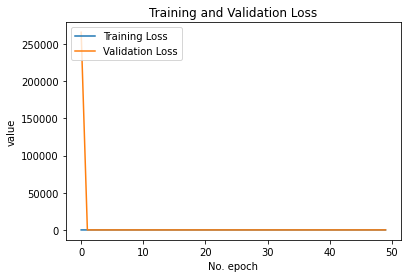

In [28]:
plt.plot(iterasi1.history['loss'], label='Training Loss')
plt.plot(iterasi1.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.ylabel('value')
plt.xlabel('No. epoch')
plt.legend(loc="upper left")
plt.show()

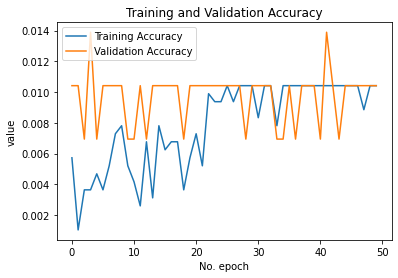

In [29]:
plt.plot(iterasi1.history['accuracy'], label='Training Accuracy')
plt.plot(iterasi1.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.ylabel('value')
plt.xlabel('No. epoch')
plt.legend(loc="upper left")
plt.show()

In [30]:
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
import numpy as np 

In [31]:
test_data_generator = test_datagen.flow_from_directory(
    'dataset/test/', # Put your path here
     target_size=(256, 256),
    batch_size=32,
    shuffle=False)
test_steps_per_epoch = np.math.ceil(test_data_generator.samples / test_data_generator.batch_size)

predictions = model.predict(test_data_generator, steps=test_steps_per_epoch)
# Get most likely class
predicted_classes = np.argmax(predictions, axis=1)

Found 288 images belonging to 96 classes.


In [32]:
true_classes = test_data_generator.classes
class_labels = list(test_data_generator.class_indices.keys())  

In [50]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix', 
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)
    sns.set(font_scale=25.0)
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")
    
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

confusion_mtx = confusion_matrix(true_classes, predicted_classes) 
plt.figure(figsize=(350,350))
# plot the confusion matrix
plot_confusion_matrix(confusion_mtx, classes = range(96))
plt.savefig('filename.png')

In [51]:
report = classification_report(true_classes, predicted_classes,target_names=class_labels)
print(report)

              precision    recall  f1-score   support

   aksara an       0.00      0.00      0.00         3
  aksara ang       0.00      0.00      0.00         3
   aksara ar       0.00      0.00      0.00         3
  aksara ban       0.00      0.00      0.00         3
 aksara bang       0.01      0.67      0.01         3
  aksara bar       0.00      0.00      0.00         3
   aksara be       0.00      0.00      0.00         3
   aksara bi       0.00      0.00      0.00         3
  aksara can       0.00      0.00      0.00         3
 aksara cang       0.00      0.00      0.00         3
  aksara car       0.00      0.00      0.00         3
   aksara ce       0.00      0.00      0.00         3
   aksara ci       0.00      0.00      0.00         3
  aksara dan       0.00      0.00      0.00         3
 aksara dang       0.00      0.00      0.00         3
  aksara dar       0.00      0.00      0.00         3
   aksara de       0.00      0.00      0.00         3
  aksara de^       0.00    

C:\Users\ROG\Anaconda3\envs\panjul\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ROG\Anaconda3\envs\panjul\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ROG\Anaconda3\envs\panjul\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [53]:
MODEL_BASE_PATH = "model_learningspeed"
PROJECT_NAME = "pengenalan"
SAVE_MODEL_NAME = "model_densenetbiasa.h5"
save_model_path = os.path.join(MODEL_BASE_PATH, PROJECT_NAME, SAVE_MODEL_NAME)

if os.path.exists(os.path.join(MODEL_BASE_PATH, PROJECT_NAME)) == False:
    os.makedirs(os.path.join(MODEL_BASE_PATH, PROJECT_NAME))
    
print('Saving Model At {}...'.format(save_model_path))
model.save(save_model_path,include_optimizer=False)

Saving Model At model_learningspeed\pengenalan\model_densenetbiasa.h5...
